# Evaluation

After modeling, we raise the question where our models tend to systematic errors. This might help us to further improve our model (e.g., by Feature Engineering).

Especially interesting are systematic errors between "False Positive" and "True Negative" on one hand, and "False Negative" and "True Positive" on the other.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import os

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, roc_curve, auc

from myfunctions import plot_categorical_features

import warnings
warnings.filterwarnings("ignore")

In [2]:
# read the dataframes with prediction outcome from last notebook 
df_train_eval = pd.read_pickle('./data/eval/df_train_eval.pkl')
df_test_eval = pd.read_pickle('./data/eval/df_test_eval.pkl')

In [3]:
# create a column that contains the classification outcome

def classification_evaluation(row):
    '''input: row of a dataframe
    output: classification outcome based on y_pred'''
    if row['churn_risk_score'] == 1 and row['y_pred'] == 1:
        return 'TruePositive'
    elif row['churn_risk_score'] == 0 and row['y_pred'] == 0:
        return 'TrueNegative'
    elif row['churn_risk_score'] == 1 and row['y_pred'] == 0:
        return 'FalseNegative'
    elif row['churn_risk_score'] == 0 and row['y_pred'] == 1:
        return 'FalsePositive'

df_train_eval['classification_outcomes'] = df_train_eval.apply(classification_evaluation, axis=1)


In [13]:
# Have a look at the data
df_train_eval.head(20)

,age,avg_time_spent,avg_transaction_value,avg_frequency_login_days,points_in_wallet,last_visit_time_hours,days_since_join,gender_M,gender_Unknown,region_category_Town,...,feedback_Products always in Stock,feedback_Quality Customer Care,feedback_Reasonable Price,feedback_Too many ads,feedback_User Friendly Website,membership_category,days_since_last_login,churn_risk_score,y_pred,classification_outcomes
0,0.753125,0.81979,-0.498559,0.798811,-0.467839,-0.65467,-1.46665,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,1,2,1,1,TruePositive
1,0.312482,2.951506,0.98405,1.141198,0.072138,-0.077269,-0.869147,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,5,16,0,0,TrueNegative
2,-1.575985,0.002486,3.386387,-0.456606,-0.007844,0.500131,-0.416303,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,4,9,0,0,TrueNegative
3,-0.568803,0.161478,0.832711,2.388238,0.154765,-0.221619,0.571148,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,3,14,1,0,FalseNegative
4,1.63441,-0.524962,-1.292708,2.874265,-0.286663,-0.51032,-1.447781,1.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0,18,1,1,TruePositive
5,1.319665,-0.533415,0.7917,0.570553,-0.397209,1.510582,-0.406869,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2,3,1,1,TruePositive
6,-0.6947,-0.323154,-0.145976,-1.027251,0.341804,-0.51032,0.417056,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,4,2,0,0,TrueNegative
7,1.004921,-0.426764,-0.756129,-0.11422,0.143414,-1.665121,1.49256,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0,19,1,1,TruePositive
8,1.571461,-0.529949,2.637583,-0.11422,0.459934,0.644482,0.036541,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,4,14,0,0,TrueNegative
9,-0.505854,-0.531345,-0.075927,0.114038,-0.311032,0.933182,0.090001,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,1,13,1,1,TruePositive


In [14]:
# Have a look at the data types
df_train_eval.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27770 entries, 0 to 27769
Data columns (total 39 columns):
 #   Column                                       Non-Null Count  Dtype 
---  ------                                       --------------  ----- 
 0   age                                          27770 non-null  object
 1   avg_time_spent                               27770 non-null  object
 2   avg_transaction_value                        27770 non-null  object
 3   avg_frequency_login_days                     27770 non-null  object
 4   points_in_wallet                             27770 non-null  object
 5   last_visit_time_hours                        27770 non-null  object
 6   days_since_join                              27770 non-null  object
 7   gender_M                                     27770 non-null  object
 8   gender_Unknown                               27770 non-null  object
 9   region_category_Town                         27770 non-null  object
 10  region_cat

In [6]:
num_features = ["age", "avg_time_spent", "avg_transaction_value", "avg_frequency_login_days", "points_in_wallet", "last_visit_time_hours", "days_since_join", "days_since_last_login","classification_outcomes"]


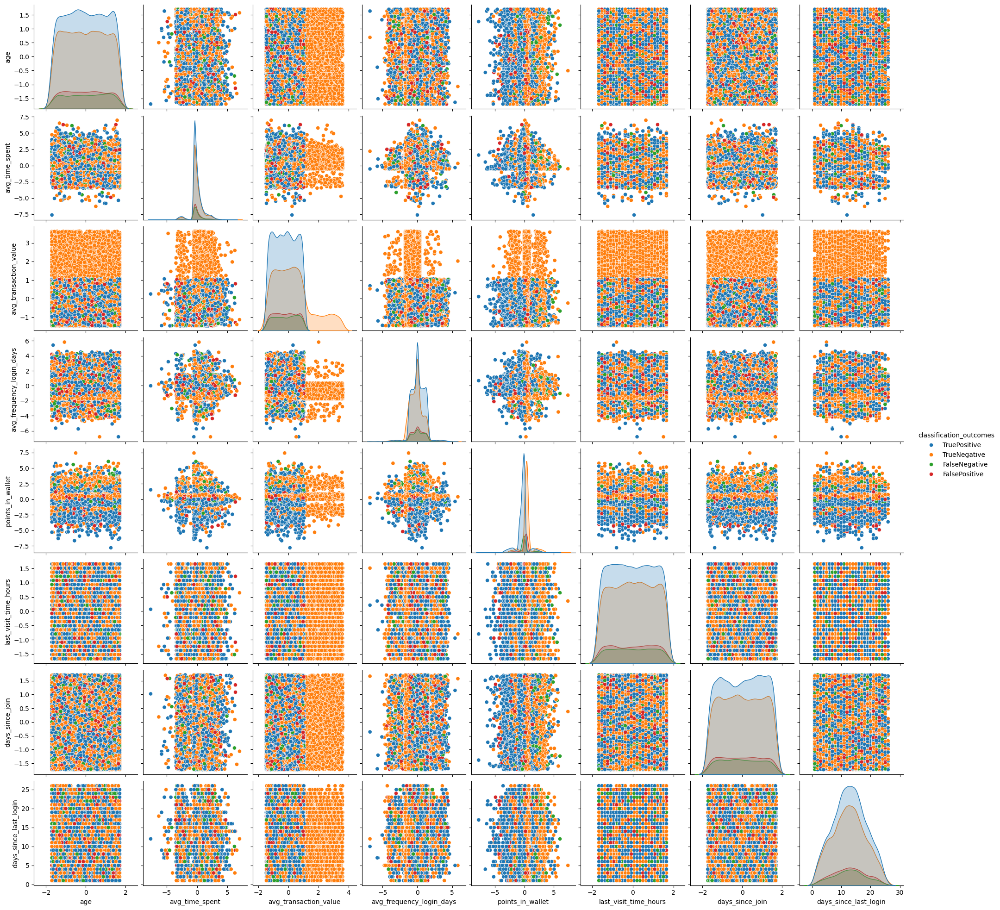

In [7]:
sns.pairplot(df_train_eval[num_features], hue='classification_outcomes')

Undersampling to get a balanced relative view for each classification outcome

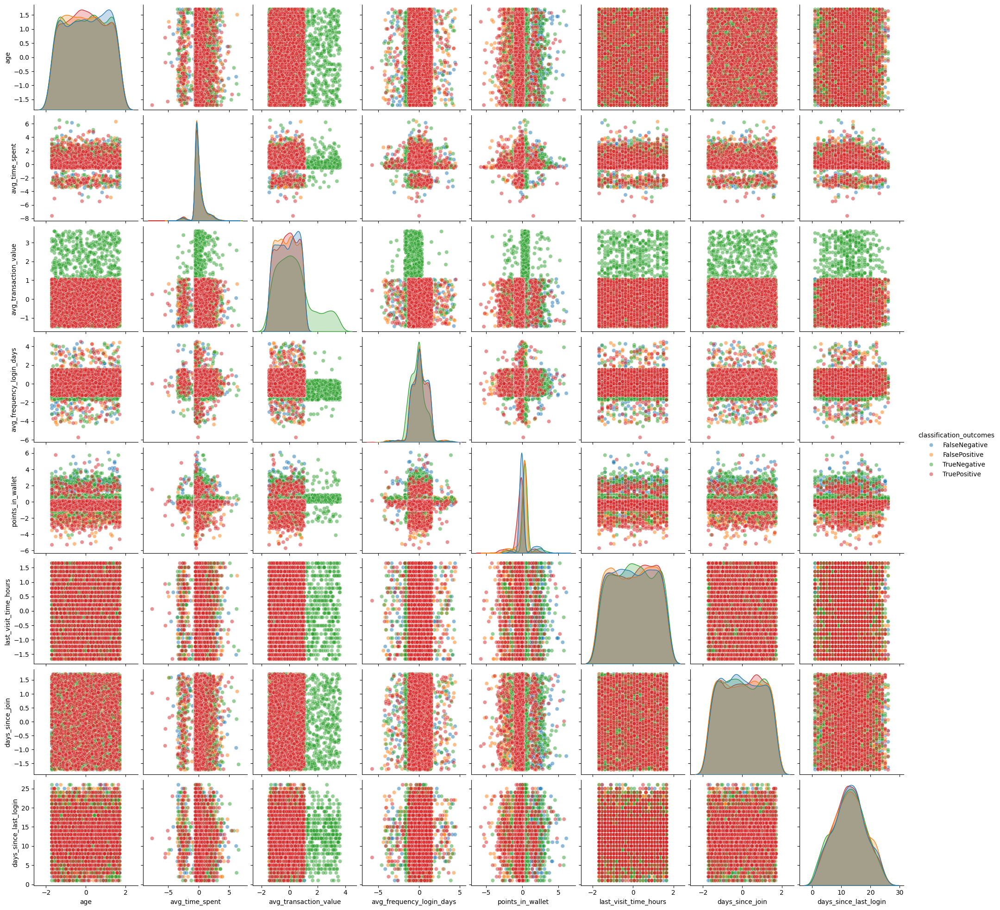

In [8]:
# Count the occurrences of each category
category_counts = df_train_eval['classification_outcomes'].value_counts()

# Determine the minimum count among categories
min_count = category_counts.min()

# Group the DataFrame by the category
grouped = df_train_eval.groupby('classification_outcomes')

# Sample each group to get a balanced DataFrame
balanced_df = grouped.apply(lambda x: x.sample(min_count))

# Reset index of the resulting DataFrame
balanced_df = balanced_df.reset_index(drop=True)

#plot balanced df
sns.pairplot(balanced_df[num_features], hue='classification_outcomes', plot_kws=dict(alpha=0.5))

In [ ]:
# OBSOLETE


# Define the order of the colors
hue_order = df_train_eval['classification_outcomes'].value_counts().index

# Drop numerical features to focus on categorical ones
df_train_eval_categorical = df_train_eval.drop(num_features, axis = 1)

# Loop over each categorical column
for plot in df_train_eval_categorical.columns:
    # Create subplots for absolute and relative views
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Absolute view: Countplot
    sns.countplot(df_train_eval, x=plot, hue='classification_outcomes', ax=axes[0], hue_order=hue_order)
    axes[0].set_title('Absolute numbers classification outcomes')

    # Rotate x-axis labels if there are more than 3 unique values or if the labels are long
    if df_train_eval[plot].nunique() > 3 or df_train_eval[plot].nunique() > 2 and len(df_train_eval[plot].unique()[0]) > 10:
        axes[0].tick_params(axis='x', rotation=45)
        axes[0].set_xticklabels(axes[0].get_xticklabels(), ha='right')

    # Relative view: Barplot
    df_prop = df_train_eval.groupby(plot)['classification_outcomes'].value_counts(normalize=True).rename('proportion').reset_index()
    sns.barplot(data=df_prop, x = plot, y='proportion', hue = 'classification_outcomes', ax = axes[1], hue_order=hue_order)
    axes[1].set_title('Relative view for each categorical value: classification outcomes')

    # Rotate x-axis labels if there are more than 3 unique values or if the labels are long
    if df_train_eval[plot].nunique() > 3 or df_train_eval[plot].nunique() > 2 and len(df_train_eval[plot].unique()[0]) > 10:
        axes[1].tick_params(axis='x', rotation=45)
        axes[1].set_xticklabels(axes[1].get_xticklabels(), ha='right')

    # Adjust layout
    plt.tight_layout()

    # Show plot
    plt.show()


### Barplot of the classification outcome for each categorical feature

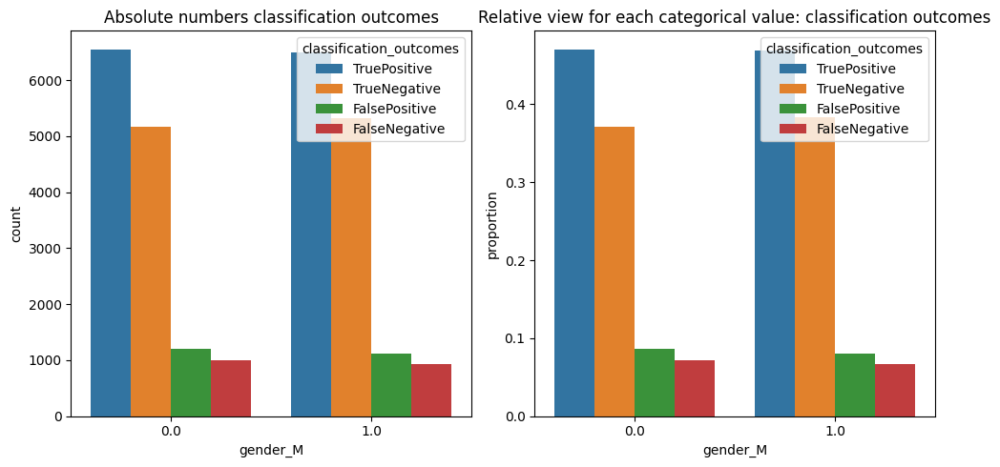

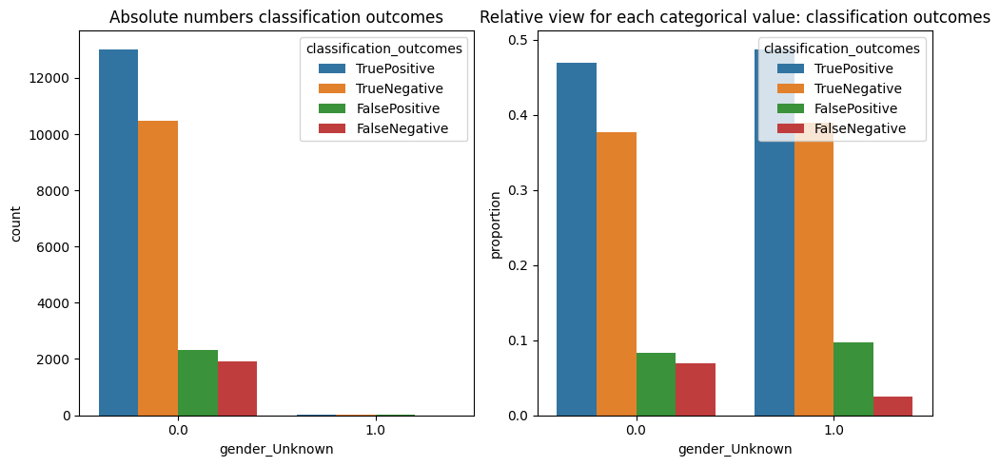

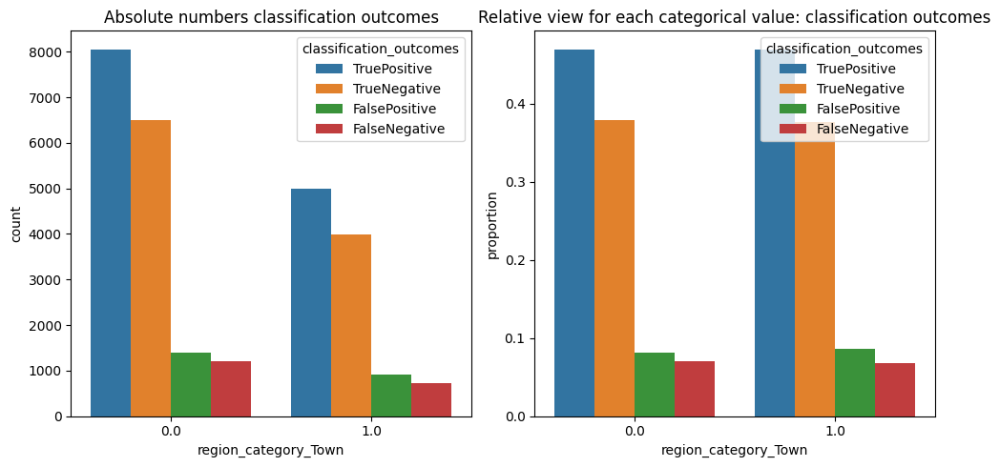

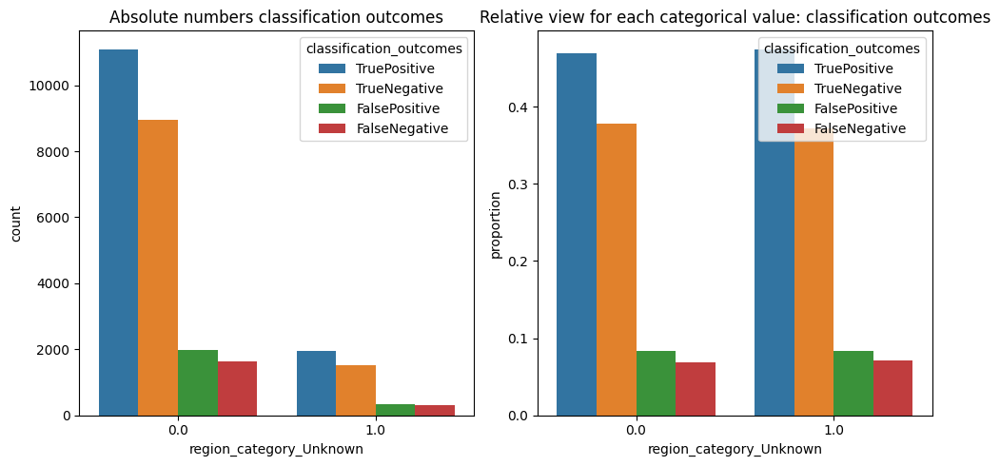

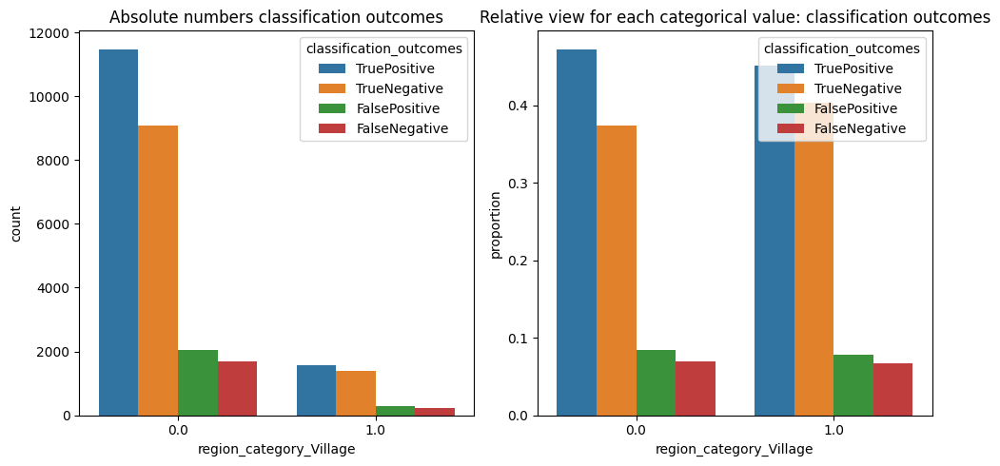

...

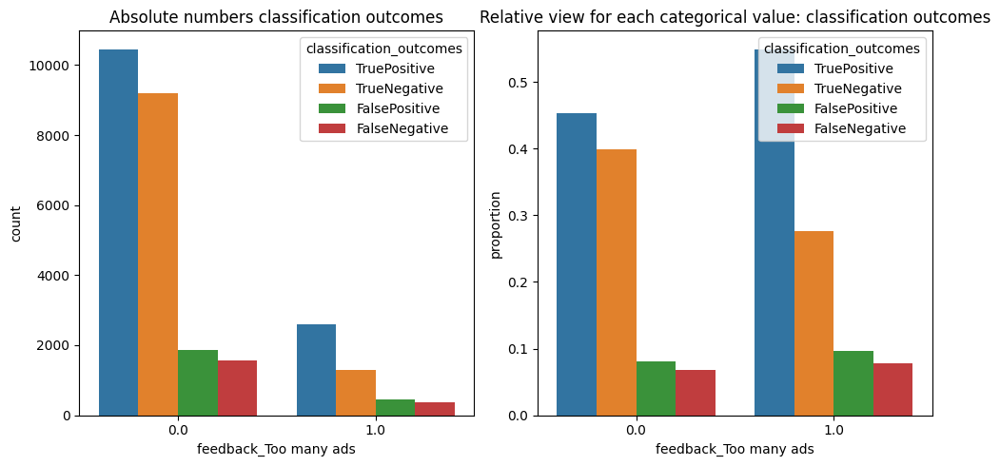

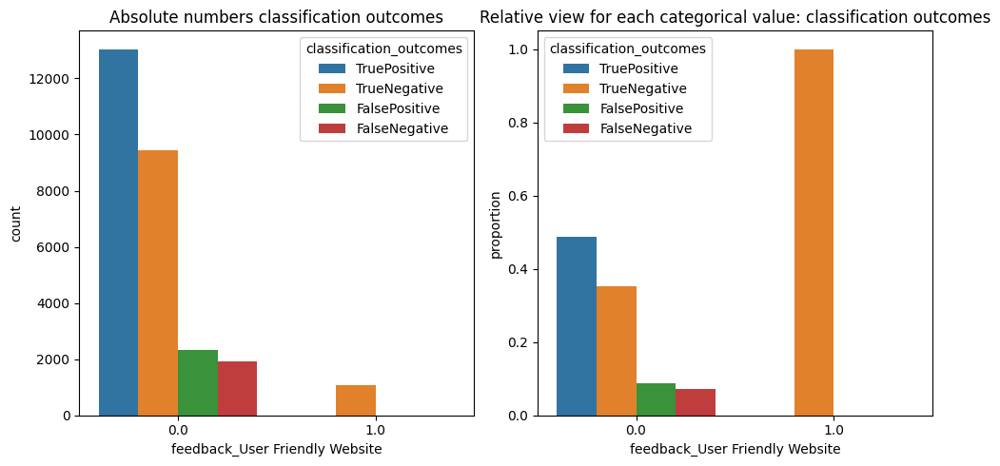

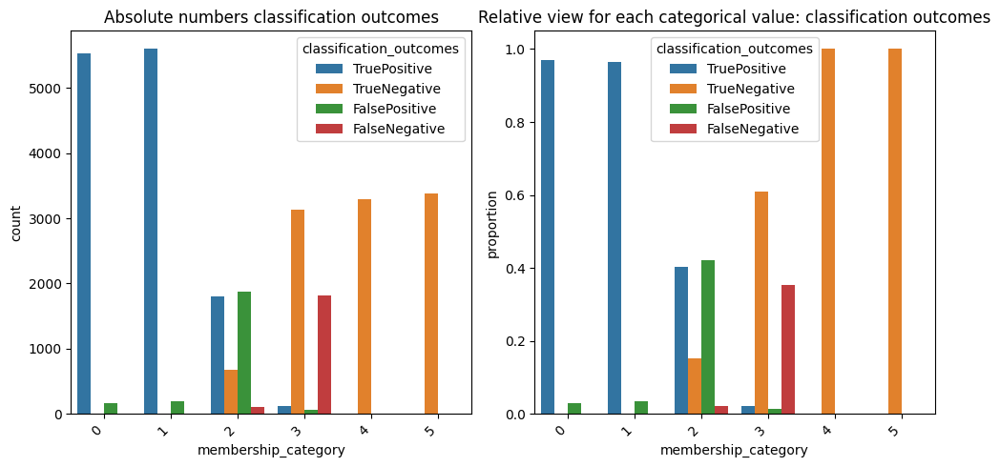

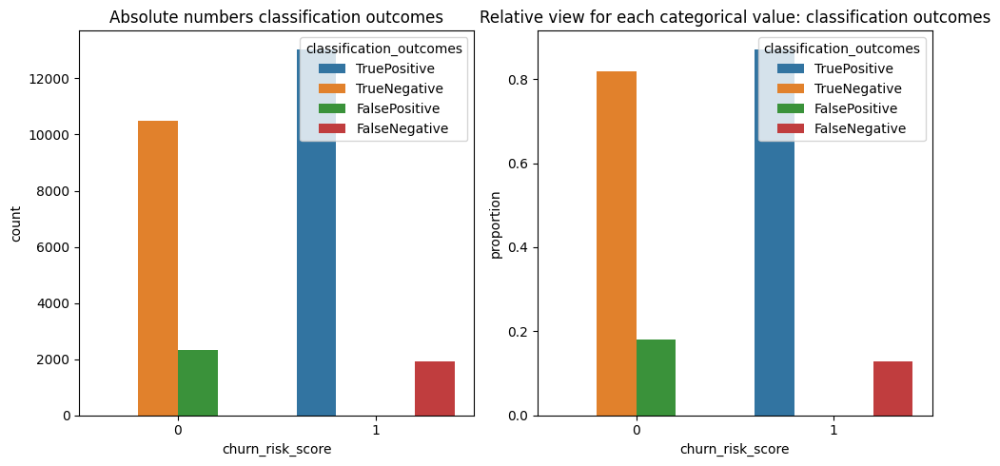

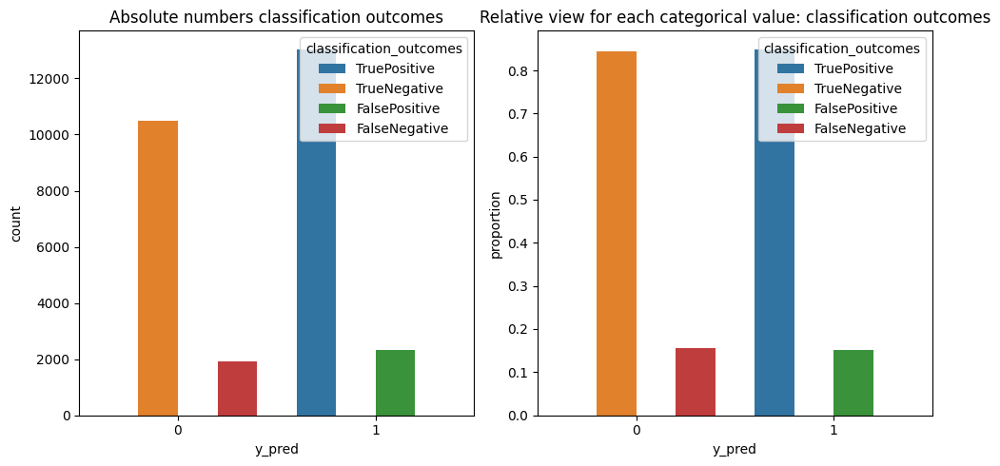

In [12]:
# Drop numerical features to focus on categorical ones
categorical_features = [col for col in df_train_eval.columns if col not in num_features]
# Plot a absolute an relative barplot of the classification outcome for each categorical feature
plot_categorical_features(df=df_train_eval, features=categorical_features, hue='classification_outcomes')

# Learnings

- if membership_category < 3 --> High tendency to false FP, while membership_category >= 3 tendency to FN
- despite importance of feedback_user_friendly_website (only 1 leads to TN), all outcome categories are at 0
- same for feedback_quality_content, feedback_reasonable_price
- high transaction value important for negative prediction
- high points in wallet might lead to FN

# To Do
- run another model
- reduce modeling to relevant features only and see how the performance looks loke
- not checked yet: interactions of multiple features